# Import all the necessasry modules/packages

In [41]:
import pandas as pd
import numpy as np
import plotly.express as px

pd.set_option('max_columns', 100)

import warnings
warnings.filterwarnings('ignore')

from pycaret.clustering import *
from pycaret.classification import *
from pycaret.utils import enable_colab
enable_colab()

Colab mode enabled.


In [2]:
# Random marketing data set I found online
# https://www.kaggle.com/jackdaoud/marketing-data
dataset = pd.read_csv('marketing_data.csv')

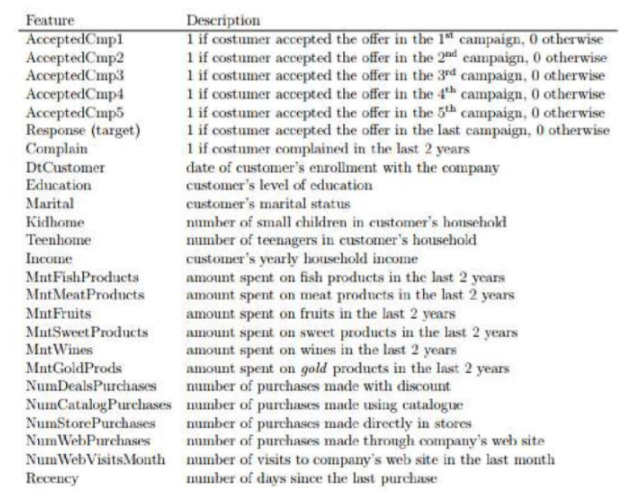

In [3]:
# Initial look at the data
dataset.head(15)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response,Complain,Country
0,1826,1970,Graduation,Divorced,"$84,835.00",0,0,6/16/14,0,189,104,379,111,189,218,1,4,4,6,1,0,0,0,0,0,1,0,SP
1,1,1961,Graduation,Single,"$57,091.00",0,0,6/15/14,0,464,5,64,7,0,37,1,7,3,7,5,0,0,0,0,1,1,0,CA
2,10476,1958,Graduation,Married,"$67,267.00",0,1,5/13/14,0,134,11,59,15,2,30,1,3,2,5,2,0,0,0,0,0,0,0,US
3,1386,1967,Graduation,Together,"$32,474.00",1,1,5/11/14,0,10,0,1,0,0,0,1,1,0,2,7,0,0,0,0,0,0,0,AUS
4,5371,1989,Graduation,Single,"$21,474.00",1,0,4/8/14,0,6,16,24,11,0,34,2,3,1,2,7,1,0,0,0,0,1,0,SP
5,7348,1958,PhD,Single,"$71,691.00",0,0,3/17/14,0,336,130,411,240,32,43,1,4,7,5,2,0,0,0,0,0,1,0,SP
6,4073,1954,2n Cycle,Married,"$63,564.00",0,0,1/29/14,0,769,80,252,15,34,65,1,10,10,7,6,1,0,0,0,0,1,0,GER
7,1991,1967,Graduation,Together,"$44,931.00",0,1,1/18/14,0,78,0,11,0,0,7,1,2,1,3,5,0,0,0,0,0,0,0,SP
8,4047,1954,PhD,Married,"$65,324.00",0,1,1/11/14,0,384,0,102,21,32,5,3,6,2,9,4,0,0,0,0,0,0,0,US
9,9477,1954,PhD,Married,"$65,324.00",0,1,1/11/14,0,384,0,102,21,32,5,3,6,2,9,4,0,0,0,0,0,0,0,IND


In [4]:
dataset.dtypes

ID                      int64
Year_Birth              int64
Education              object
Marital_Status         object
 Income                object
Kidhome                 int64
Teenhome                int64
Dt_Customer            object
Recency                 int64
MntWines                int64
MntFruits               int64
MntMeatProducts         int64
MntFishProducts         int64
MntSweetProducts        int64
MntGoldProds            int64
NumDealsPurchases       int64
NumWebPurchases         int64
NumCatalogPurchases     int64
NumStorePurchases       int64
NumWebVisitsMonth       int64
AcceptedCmp3            int64
AcceptedCmp4            int64
AcceptedCmp5            int64
AcceptedCmp1            int64
AcceptedCmp2            int64
Response                int64
Complain                int64
Country                object
dtype: object

# Data Cleaning

In [5]:
# There are a few things we need to do.  Change a few data types, clean up a column name and remove some symbols that are not necessary

In [6]:
# Looking at the columns, looks like ' Income ' has a space before and after the word.  All others look good
dataset.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', ' Income ',
       'Kidhome', 'Teenhome', 'Dt_Customer', 'Recency', 'MntWines',
       'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Response', 'Complain', 'Country'],
      dtype='object')

In [7]:
# Renaming to remove the whitespace
dataset.rename(columns = {' Income ': 'Income'}, inplace=True)

In [8]:
# If we look at a single datapoint in income, there are symbols we dont need and trailing zeros. Lets take care of both.
# Have to remove the '$' before changing to a float
dataset['Income'][2]

'$67,267.00 '

In [9]:
# Removing the dollar sign, comma and whitespace after the number
dataset['Income'] = dataset['Income'].str.replace('[$, ]','')

In [12]:
# Changing data type from an object to a float
dataset['Income'] = dataset['Income'].astype(float)

In [13]:
# Rounding to make a little cleaner
dataset['Income'].round(0)

0       84835.0
1       57091.0
2       67267.0
3       32474.0
4       21474.0
         ...   
2235    66476.0
2236    31056.0
2237    46310.0
2238    65819.0
2239    94871.0
Name: Income, Length: 2240, dtype: float64

In [14]:
# Checking to make sure its what we want
dataset['Income'][2]

67267.0

In [17]:
# Now lets change Dt_Customer to an actual datetime, not an object that looks like a datetime
dataset['Dt_Customer'] = pd.to_datetime(dataset['Dt_Customer'])

In [18]:
# to_datetime automatically throws the seconds on there but it wont matter...showing the column type is a timestamp
print(dataset['Dt_Customer'][0])
type(dataset['Dt_Customer'][0])

2014-06-16 00:00:00


pandas._libs.tslibs.timestamps.Timestamp

In [19]:
dataset.head(10)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response,Complain,Country
0,1826,1970,Graduation,Divorced,84835.0,0,0,2014-06-16,0,189,104,379,111,189,218,1,4,4,6,1,0,0,0,0,0,1,0,SP
1,1,1961,Graduation,Single,57091.0,0,0,2014-06-15,0,464,5,64,7,0,37,1,7,3,7,5,0,0,0,0,1,1,0,CA
2,10476,1958,Graduation,Married,67267.0,0,1,2014-05-13,0,134,11,59,15,2,30,1,3,2,5,2,0,0,0,0,0,0,0,US
3,1386,1967,Graduation,Together,32474.0,1,1,2014-05-11,0,10,0,1,0,0,0,1,1,0,2,7,0,0,0,0,0,0,0,AUS
4,5371,1989,Graduation,Single,21474.0,1,0,2014-04-08,0,6,16,24,11,0,34,2,3,1,2,7,1,0,0,0,0,1,0,SP
5,7348,1958,PhD,Single,71691.0,0,0,2014-03-17,0,336,130,411,240,32,43,1,4,7,5,2,0,0,0,0,0,1,0,SP
6,4073,1954,2n Cycle,Married,63564.0,0,0,2014-01-29,0,769,80,252,15,34,65,1,10,10,7,6,1,0,0,0,0,1,0,GER
7,1991,1967,Graduation,Together,44931.0,0,1,2014-01-18,0,78,0,11,0,0,7,1,2,1,3,5,0,0,0,0,0,0,0,SP
8,4047,1954,PhD,Married,65324.0,0,1,2014-01-11,0,384,0,102,21,32,5,3,6,2,9,4,0,0,0,0,0,0,0,US
9,9477,1954,PhD,Married,65324.0,0,1,2014-01-11,0,384,0,102,21,32,5,3,6,2,9,4,0,0,0,0,0,0,0,IND


In [20]:
data = dataset.sample(frac=0.95, random_state=786).reset_index(drop=True)
data_unseen = dataset.drop(data.index).reset_index(drop=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (2128, 28)
Unseen Data For Predictions: (112, 28)


In [21]:
exp_clu101 = setup(data, normalize = True, 
                   ignore_features = ['ID'],
                   session_id = 123)

,Description,Value
0,session_id,123
1,Original Data,"(2128, 28)"
2,Missing Values,True
3,Numeric Features,9
4,Categorical Features,17
5,Ordinal Features,False
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(2128, 147)"
9,CPU Jobs,-1


In [22]:
kmeans = create_model('kmeans')

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0897,232.6607,3.1408,0,0,0


In [23]:
print(kmeans)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=4, n_init=10, n_jobs=-1, precompute_distances='deprecated',
       random_state=123, tol=0.0001, verbose=0)


In [24]:
kmodes = create_model('kmodes', num_clusters = 6)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0168,81.2404,4.2223,0,0,0


In [25]:
print(kmodes)

KModes(cat_dissim=<function matching_dissim at 0x0000017CB36ABAF0>, init='Cao',
       max_iter=100, n_clusters=6, n_init=1, n_jobs=-1, random_state=123,
       verbose=0)


In [26]:
kmean_results = assign_model(kmeans)

In [27]:
kmean_results.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response,Complain,Country,Cluster
0,2669,1993,Graduation,Single,74293.0,0,0,2014-05-04,66,375,...,2,0,0,0,0,0,0,0,SP,Cluster 3
1,9596,1980,PhD,Single,65295.0,0,0,2013-12-23,19,365,...,2,0,0,0,0,0,0,0,US,Cluster 1
2,2798,1977,PhD,Together,102160.0,0,0,2012-11-02,54,763,...,4,0,1,1,1,0,1,0,SA,Cluster 1
3,837,1977,Graduation,Married,54809.0,1,1,2013-09-11,0,63,...,4,0,0,0,0,0,0,0,SP,Cluster 0
4,340,1970,Graduation,Divorced,72967.0,0,1,2012-12-15,1,158,...,5,1,0,0,0,0,1,0,GER,Cluster 2


In [28]:
plot_model(kmeans)

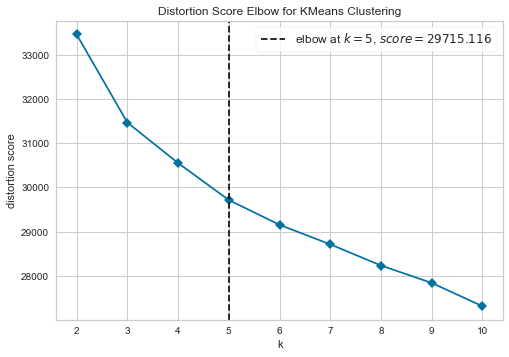

In [29]:
plot_model(kmeans, plot = 'elbow')

In [30]:
# Elbow plot suggests 5 clusters, so creating a model that has 5 clusters
kmeans5 = create_model('kmeans', num_clusters = 5)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0554,194.281,3.2363,0,0,0


In [31]:
plot_model(kmeans5)

In [32]:
# Not a clean plot...too many points but threw it on here to play around with and its quite fascinating 
plot_model(kmeans5, plot = 'tsne')

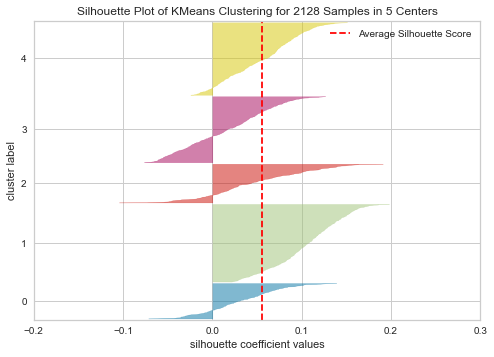

In [33]:
plot_model(kmeans5, plot = 'silhouette')

In [34]:
# To see size of clusters
plot_model(kmeans5, plot = 'distribution') 

In [35]:
plot_model(kmeans5, plot = 'distribution', feature = 'Education')

In [36]:
plot_model(kmeans5, plot = 'distribution', feature = 'Year_Birth')

In [39]:
plot_model(kmeans5, plot = 'distribution', feature = 'Income')

In [38]:
fig = px.histogram(dataset, x=['Income'], template = 'plotly_dark', title = 'Histogram of Income')
fig.show()

In [43]:
from pycaret.regression import *
s = setup(dataset, target = 'Income', transform_target = True, log_experiment = True, experiment_name = 'Marketing')

,Description,Value
0,session_id,5492
1,Target,Income
2,Original Data,"(2240, 28)"
3,Missing Values,True
4,Numeric Features,9
5,Categorical Features,17
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(1547, 135)"


In [45]:
best = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
catboost,CatBoost Regressor,5473.8413,71344742.0661,8157.6435,0.8447,0.2163,0.1601,2.3600
lightgbm,Light Gradient Boosting Machine,5706.5088,76226538.4099,8447.9878,0.8336,0.2306,0.1664,0.3490
et,Extra Trees Regressor,5769.9628,79032715.9868,8668.0238,0.8258,0.2337,0.1753,0.6910
xgboost,Extreme Gradient Boosting,5764.0235,82164950.8000,8782.0390,0.8202,0.2296,0.1644,0.7330
gbr,Gradient Boosting Regressor,6015.4940,86560274.4720,8977.3694,0.8110,0.2390,0.1828,0.2340
rf,Random Forest Regressor,6136.5188,86153789.6427,9028.0411,0.8103,0.2439,0.1745,0.5370
ridge,Ridge Regression,6545.3423,88629646.0000,9219.4503,0.8046,0.2476,0.2039,0.0110
br,Bayesian Ridge,6542.6713,88646668.9659,9219.7528,0.8046,0.2462,0.2027,0.0180
lr,Linear Regression,6595.5847,90011405.2000,9292.9226,0.8012,0.2554,0.2048,0.0120
ada,AdaBoost Regressor,7548.8140,128392233.4052,10984.8603,0.7185,0.2827,0.2484,0.1630
